Import Libraries

In [0]:
from pyspark.sql import SparkSession,Window
import pandas as pd
from pyspark.sql.functions import isnan, when, count, col,udf,max
from matplotlib import pyplot as plt 
import datetime
import re
from pyspark.sql.types import IntegerType
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import RandomForestClassifier,GBTClassifier
from pyspark.ml.feature import StandardScaler
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
import time
from pyspark.ml.evaluation import BinaryClassificationEvaluator
import seaborn as sns
import numpy as np

In [0]:
spark = SparkSession.builder \
    .master("local") \
    .appName("my_sparkify") \
    .getOrCreate()

In [0]:
storage_account_name = "nypbigdatastorage"
storage_account_access_key = "W86xe/oS/fZujFMoku3wahZMNzipVRnTWPvkphyl23Csmn4xOad+0ay9ZPcfzYgWucMaT8qzHs+fGiRmOZ2PFQ=="
file_checkin = "wasbs://nypbigdatacontainer@nypbigdatastorage.blob.core.windows.net/checkin.json"
file_biz = "wasbs://nypbigdatacontainer@nypbigdatastorage.blob.core.windows.net/biz.json"
#file_location = "wasbs://nypbigdatacontainer@nypbigdatastorage.blob.core.windows.net/user.json"
#file_location = "wasbs://nypbigdatacontainer@nypbigdatastorage.blob.core.windows.net/review.json"
# file_location = "wasbs://nypbigdatacontainer@nypbigdatastorage.blob.core.windows.net/tip.json"
file_type = "json"
spark.conf.set(
  "fs.azure.account.key."+storage_account_name+".blob.core.windows.net",
  storage_account_access_key)

In [0]:
checkin_df_spark = spark.read.format(file_type).option("inferSchema", "true").load(file_checkin)
biz_df_spark = spark.read.format(file_type).option("inferSchema", "true").load(file_biz)

In [0]:
display(checkin_df_spark)

business_id date --1UhMGODdWsrMastO9DZw 2016-04-26 19:49:16, 2016-08-30 18:36:57, 2016-10-15 02:45:18, 2016-11-18 01:54:50, 2017-04-20 18:39:06, 2017-05-03 17:58:02, 2019-03-19 22:04:48 --6MefnULPED_I942VcFNA 2011-06-04 18:22:23, 2011-07-23 23:51:33, 2012-04-15 01:07:50, 2012-05-06 23:08:42, 2012-06-08 22:43:12, 2012-08-06 23:20:52, 2012-08-19 18:30:44, 2013-01-27 23:49:51, 2013-03-01 01:22:29, 2013-03-23 21:53:47, 2013-03-24 01:11:51, 2013-05-20 00:12:25, 2013-06-29 22:50:57, 2013-07-01 15:58:04, 2013-07-01 22:35:42, 2013-07-28 21:46:49, 2013-08-02 22:06:03, 2013-08-11 18:42:03, 2013-08-23 01:29:56, 2013-09-17 17:40:36, 2013-09-20 23:36:30, 2013-09-24 23:50:18, 2013-10-12 23:11:13, 2013-11-24 18:40:15, 2013-12-12 02:52:54, 2013-12-26 17:33:17, 2013-12-30 00:27:37, 2014-03-28 23:38:23, 2014-04-25 22:48:11, 2014-04-28 22:56:07, 2014-05-03 01:02:47, 2014-05-19 17:08:37, 2014-06-16 00:04:51, 2014-06-22 17:21:27, 2014-07-04 19:13:34, 2014-07-11 15:46:29, 2014-07-25 20:55:48, 2014-08-23 22:27:42, 2014-08-31 01:43:10, 2014-09-06 16:29:55, 2014-09-13 23:34:42, 2014-10-11 23:20:09, 2014-11-19 19:05:56, 2014-11-30 23:27:15, 2015-01-04 01:06:47, 2015-01-04 01:08:08, 2015-01-11 00:16:13, 2015-01-17 23:42:09, 2015-01-17 23:46:42, 2015-01-26 00:05:15, 2015-02-18 17:21:01, 2015-03-22 22:26:09, 2015-03-28 22:47:50, 2015-04-03 21:49:35, 2015-04-05 18:52:21, 2015-04-11 22:59:11, 2015-04-12 22:52:29, 2015-04-24 00:02:22, 2015-05-09 21:45:34, 2015-05-16 22:53:44, 2015-06-07 17:54:51, 2015-07-01 16:24:54, 2015-07-10 22:13:09, 2015-07-11 22:16:37, 2015-07-18 00:27:00, 2015-08-29 23:51:50, 2015-09-07 22:57:51, 2015-09-27 23:54:33, 2015-10-11 22:03:40, 2015-10-12 15:08:23, 2015-10-23 01:34:21, 2015-10-25 00:36:12, 2015-11-09 18:55:17, 2015-11-15 00:01:47, 2015-12-16 19:59:00, 2015-12-27 01:00:59, 2016-01-23 19:05:37, 2016-01-30 23:54:10, 2016-02-07 03:19:01, 2016-02-13 17:49:41, 2016-02-16 00:16:10, 2016-03-27 21:14:50, 2016-04-02 16:29:16, 2016-04-02 17:17:50, 2016-04-16 22:27:48, 2016-04-27 23:54:21, 2016-05-07 21:52:13, 2016-05-21 22:14:00, 2016-06-04 23:06:32, 2016-06-11 22:23:48, 2016-07-01 02:59:31, 2016-07-02 23:01:47, 2016-07-06 22:27:12, 2016-07-08 00:49:30, 2016-07-16 23:53:17, 2016-07-26 17:15:19, 2016-08-01 22:46:32, 2016-08-02 00:14:10, 2016-08-18 03:19:16, 2016-08-20 12:47:15, 2016-08-21 12:24:31, 2016-09-15 20:31:53, 2016-10-03 01:04:15, 2016-10-03 01:04:25, 2016-11-26 00:48:51, 2016-12-24 17:56:29, 2016-12-31 18:29:26, 2017-01-09 01:07:12, 2017-01-15 03:53:00, 2017-01-15 17:30:16, 2017-01-28 00:44:48, 2017-02-10 20:18:01, 2017-02-18 23:13:18, 2017-02-19 00:30:24, 2017-02-20 02:04:48, 2017-04-16 22:46:55, 2017-04-27 04:38:34, 2017-05-13 22:51:49, 2017-05-19 23:03:19, 2017-05-31 22:46:11, 2017-05-31 22:46:33, 2017-07-28 23:38:19, 2017-08-13 23:42:59, 2017-08-17 23:27:33, 2017-09-03 17:30:25, 2017-09-03 22:59:25, 2017-09-16 21:12:41, 2017-09-18 00:36:34, 2017-09-28 23:28:02, 2017-10-01 13:02:01, 2017-10-08 00:00:05, 2017-10-08 15:07:36, 2017-10-09 00:44:22, 2017-10-15 22:31:47, 2017-10-17 23:31:26, 2017-10-17 23:32:10, 2017-11-04 22:48:12, 2017-11-10 20:50:25, 2017-12-17 23:02:32, 2017-12-21 00:55:13, 2017-12-29 01:53:12, 2017-12-29 01:53:52, 2018-01-26 00:47:30, 2018-03-30 16:49:10, 2018-04-07 16:27:21, 2018-04-24 23:45:19, 2018-05-05 18:27:12, 2018-05-05 22:27:18, 2018-05-14 23:47:27, 2018-05-20 23:49:45, 2018-05-25 16:39:21, 2018-06-04 21:40:47, 2018-06-04 21:40:58, 2018-06-12 22:27:30, 2018-06-20 22:53:27, 2018-07-05 16:15:18, 2018-07-08 18:40:13, 2018-07-08 20:41:46, 2018-07-18 20:58:49, 2018-07-24 23:35:44, 2018-08-09 00:08:56, 2018-08-20 22:29:00, 2018-08-31 17:47:54, 2018-09-13 23:08:09, 2018-09-15 22:16:51, 2018-10-21 18:09:02, 2018-10-21 22:58:14, 2018-11-24 00:37:46, 2018-12-17 01:22:50, 2018-12-29 17:15:48, 2019-01-01 22:41:14, 2019-01-06 23:16:27, 2019-02-09 19:09:55, 2019-02-10 00:04:52, 2019-03-02 23:45:36, 2019-04-20 22:27:13, 2019-05-05 00:23:49, 2019-05-05 18:28:36, 2019-05-05 22:04:14, 2019-05-14 23:35:44, 2019-05-18 

In [0]:
display(biz_df_spark)

address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state
10913 Bailey Rd,"List(null, null, null, null, null, null, null, True, null, True, {'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}, False, null, null, null, null, null, null, null, False, null, null, null, null, null, null, null, null, null, null, null, null, 3, null, null, null, null, null, null)",f9NumwFMBDn751xgFiRbNA,"Active Life, Gun/Rifle Ranges, Guns & Ammo, Shopping",Cornelius,"List(11:0-20:0, 10:0-18:0, 11:0-20:0, 13:0-18:0, 11:0-20:0, 11:0-20:0, 10:0-18:0)",1,35.4627242,-80.8526119,The Range At Lake Norman,28031,36,3.5,NC
"8880 E Via Linda, Ste 107","List(null, null, null, null, null, null, null, null, null, null, null, True, null, null, null, null, null, null, null, True, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null)",Yzvjg0SayhoZgCljUJRF9Q,"Health & Medical, Fitness & Instruction, Yoga, Active Life, Pilates",Scottsdale,null,1,33.5694041,-111.8902637,"Carlos Santo, NMD",85258,4,5.0,AZ
3554 Rue Notre-Dame O,null,XNoUzKckATkOD1hP6vghZg,"Pets, Pet Services, Pet Groomers",Montreal,null,1,45.479984,-73.58007,Felinus,H4C 1P4,5,5.0,QC
1015 Sharp Cir,"List(null, null, null, null, null, null, null, True, null, True, {'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}, False, null, null, null, null, True, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, 4, null, null, null, null, null, null)",6OAZjbxqM5ol29BuHsil3w,"Hardware Stores, Home Services, Building Supplies, Home & Garden, Shopping",North Las Vegas,"List(7:0-16:0, 7:0-16:0, null, null, 7:0-16:0, 7:0-16:0, 7:0-16:0)",0,36.2197281,-115.1277255,Nevada House of Hose,89030,3,2.5,NV
4827 E Downing Cir,"List(null, null, null, null, null, null, null, null, null, True, null, True, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null)",51M2Kk903DFYI6gnB5I6SQ,"Home Services, Plumbing, Electricians, Handyman, Contractors",Mesa,"List(9:0-16:0, 0:0-0:0, null, null, 9:0-16:0, 9:0-16:0, 9:0-16:0)",1,33.4280652,-111.7266485,USE MY GUY SERVICES LLC,85205,26,4.5,AZ
"1720 W Elliot Rd, Ste 105","List(null, null, null, null, null, null, null, null, null, True, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null)",cKyLV5oWZJ2NudWgqs8VZw,"Auto Repair, Automotive, Oil Change Stations, Transmission Repair",Gilbert,"List(7:0-18:0, 7:0-18:0, 7:0-15:0, null, 7:0-18:0, 7:0-18:0, 7:0-18:0)",1,33.3503993,-111.8271417,Oasis Auto Center - Gilbert,85233,38,4.5,AZ
"6870 S Rainbow Blvd, Ste 117","List(null, null, null, null, null, null, null, True, null, True, {'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, 1, null, null, null, null, null, u'no')",oiAlXZPIFm2nBCt0DHLu_Q,"Dry Cleaning & Laundry, Local Services, Laundry Services",Las Vegas,"List(7:0-19:0, 7:0-19:0, 9:0-17:0, null, 7:0-19:0, 7:0-19:0, 7:0-19:0)",1,36.0639767,-115.241463,Green World Cleaners,89118,81,3.5,NV
6910 E Southern Ave,"List(null, null, null, null, null, null, null, null, null, True, null, False, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null)",ScYkbYNkDgCneBrD9vqhCQ,"Auto Repair, Oil Change Stations, Automotive, Tires",Mesa,"List(7:30-17:0, 7:30-17:0, 7:30-13:0, null, 7:30-17:0, 7:30-17:0, 7:30-17:0)",1,33.3938847,-111.6822257,Junction Tire & Auto Service,85209,18,5.0,AZ
404 E Green St,"List(null, null, 'none', null, null, null, null, False, nu

In [0]:
biz_df_spark.columns

Out[7]: ['address',
 'attributes',
 'business_id',
 'categories',
 'city',
 'hours',
 'is_open',
 'latitude',
 'longitude',
 'name',
 'postal_code',
 'review_count',
 'stars',
 'state']

In [0]:
biz_df_spark.describe()

Out[8]: DataFrame[summary: string, address: string, business_id: string, categories: string, city: string, is_open: string, latitude: string, longitude: string, name: string, postal_code: string, review_count: string, stars: string, state: string]

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.functions import *
join_df = biz_df_spark.join(checkin_df_spark, on=['business_id'],how='inner')
checkin=join_df.withColumn('Numofcheckin',F.size(F.split(F.col('date'),",")))
display(checkin)

business_id address attributes categories city hours is_open latitude longitude name postal_code review_count stars state date Numofcheckin --9e1ONYQuAa-CB_Rrw7Tw 3355 Las Vegas Blvd S List(null, null, 'full_bar', {'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}, null, 'yes_corkage', null, False, null, True, {'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}, null, False, null, True, null, False, null, null, False, {'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}, null, False, True, null, u'average', null, False, 'dressy', null, False, True, 4, True, null, False, null, null, u'no') Seafood, Cajun/Creole, Restaurants, Steakhouses Las Vegas List(17:0-22:30, 17:0-22:0, 17:0-22:30, 17:0-22:0, 17:0-22:0, 17:0-22:0, 17:0-22:0) 1 36.123183 -115.16919 Delmonico Steakhouse 89109 1759 4.0 NV 2010-02-08 05:56:47, 2010-02-15 04:47:42, 2010-02-22 03:20:16, 2010-03-12 05:18:41, 2010-03-19 03:42:08, 2010-04-09 01:55:53, 2010-04-24 20:16:35, 2010-05-08 05:17:27, 2010-05-19 03:11:51, 2010-06-03 02:32:28, 2010-06-24 09:58:07, 2010-07-05 04:11:30, 2010-07-17 02:49:40, 2010-07-17 09:05:32, 2010-07-18 02:21:34, 2010-07-18 02:56:08, 2010-07-18 05:16:04, 2010-07-21 02:27:10, 2010-07-25 01:28:01, 2010-07-26 03:16:41, 2010-07-30 03:50:24, 2010-07-31 02:34:39, 2010-08-02 02:38:34, 2010-08-07 01:28:18, 2010-08-07 01:43:14, 2010-08-07 01:48:20, 2010-08-07 02:52:29, 2010-08-08 00:42:26, 2010-08-08 02:30:45, 2010-08-08 20:27:39, 2010-08-08 21:18:06, 2010-08-11 02:55:32, 2010-08-14 21:04:06, 2010-08-17 03:03:10, 2010-08-24 15:27:32, 2010-08-25 08:45:51, 2010-08-25 17:56:36, 2010-08-28 05:13:05, 2010-08-29 01:12:46, 2010-08-29 01:43:13, 2010-09-03 02:15:09, 2010-09-06 04:00:21, 2010-09-12 04:07:39, 2010-09-14 23:01:59, 2010-09-15 00:43:59, 2010-09-19 03:55:49, 2010-09-27 04:33:36, 2010-09-29 21:04:31, 2010-10-03 00:20:37, 2010-10-08 05:27:40, 2010-10-09 21:35:37, 2010-10-10 02:29:13, 2010-10-12 01:27:03, 2010-10-21 01:41:44, 2010-10-21 03:15:33, 2010-10-22 20:45:56, 2010-10-23 02:50:13, 2010-10-23 03:13:37, 2010-10-29 07:04:05, 2010-11-01 01:05:14, 2010-11-03 03:07:35, 2010-11-06 03:45:57, 2010-11-07 04:26:57, 2010-11-11 03:34:30, 2010-11-13 01:59:19, 2010-11-13 03:15:35, 2010-11-13 03:35:44, 2010-11-13 04:00:31, 2010-11-13 04:21:45, 2010-11-17 02:21:45, 2010-11-17 02:27:38, 2010-11-20 05:01:31, 2010-11-21 04:05:57, 2010-11-22 01:56:26, 2010-11-22 03:21:47, 2010-11-22 05:22:55, 2010-11-26 03:31:25, 2010-11-29 01:53:37, 2010-12-05 06:38:42, 2010-12-08 02:57:02, 2010-12-11 02:17:33, 2010-12-11 02:26:35, 2010-12-11 05:40:54, 2010-12-17 04:45:22, 2010-12-17 20:07:05, 2010-12-21 01:08:54, 2010-12-24 05:02:25, 2010-12-24 19:51:00, 2010-12-26 22:06:35, 2011-01-04 03:12:44, 2011-01-07 02:37:21, 2011-01-07 03:58:13, 2011-01-08 04:47:05, 2011-01-17 03:45:49, 2011-01-20 06:56:16, 2011-01-23 03:33:25, 2011-01-24 03:22:22, 2011-01-25 04:38:51, 2011-01-25 04:52:46, 2011-02-04 03:06:59, 2011-02-07 04:09:16, 2011-02-12 02:33:05, 2011-02-12 09:25:14, 2011-02-14 02:42:42, 2011-02-14 02:45:18, 2011-02-14 03:13:07, 2011-02-20 02:04:11, 2011-02-21 02:13:17, 2011-02-21 06:17:12, 2011-02-22 02:44:49, 2011-02-26 04:06:55, 2011-02-27 01:45:56, 2011-02-27 03:24:31, 2011-02-28 06:19:01, 2011-03-06 01:58:07, 2011-03-13 02:22:04, 2011-03-13 02:24:26, 2011-03-15 01:35:14, 2011-03-15 03:07:58, 2011-03-15 03:25:59, 2011-03-19 03:03:30, 2011-03-19 20:49:04, 2011-03-20 02:05:03, 2011-03-20 05:29:50, 2011-03-21 01:30:33, 2011-03-26 01:36:31, 2011-03-26 19:35:09, 2011-03-27 03:34:42, 2011-03-29 04:03:07, 2011-04-03 00:15:18, 2011-04-03 02:34:23, 2011-04-07 02:27:54, 2011-04-10 00:56:58, 2011-04-10 00:58:32, 2011-04-10 01:01:32, 2011-04-10 01:24:48, 2011-04-10 01:46:59, 2011-04-10 01:47:42, 2011-04-10 02:15:23, 2011-04-13 03:44:21, 2011-04-14 02:45:55, 2011-04-14 18:55:30, 2011-04-16 04:03:35, 201

In [0]:
checkin.createOrReplaceTempView("checkin")

In [0]:
%sql
create or replace temporary view checkin_1 as select *, hours.*,explode(split(to_date(date),","))Dates, attributes.* from checkin

In [0]:
%sql
select * from checkin_1

business_id address attributes categories city hours is_open latitude longitude name postal_code review_count stars state date Numofcheckin Friday Monday Saturday Sunday Thursday Tuesday Wednesday Dates AcceptsInsurance AgesAllowed Alcohol Ambience BYOB BYOBCorkage BestNights BikeParking BusinessAcceptsBitcoin BusinessAcceptsCreditCards BusinessParking ByAppointmentOnly Caters CoatCheck Corkage DietaryRestrictions DogsAllowed DriveThru GoodForDancing GoodForKids GoodForMeal HairSpecializesIn HappyHour HasTV Music NoiseLevel Open24Hours OutdoorSeating RestaurantsAttire RestaurantsCounterService RestaurantsDelivery RestaurantsGoodForGroups RestaurantsPriceRange2 RestaurantsReservations RestaurantsTableService RestaurantsTakeOut Smoking WheelchairAccessible WiFi --9e1ONYQuAa-CB_Rrw7Tw 3355 Las Vegas Blvd S List(null, null, 'full_bar', {'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}, null, 'yes_corkage', null, False, null, True, {'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}, null, False, null, True, null, False, null, null, False, {'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}, null, False, True, null, u'average', null, False, 'dressy', null, False, True, 4, True, null, False, null, null, u'no') Seafood, Cajun/Creole, Restaurants, Steakhouses Las Vegas List(17:0-22:30, 17:0-22:0, 17:0-22:30, 17:0-22:0, 17:0-22:0, 17:0-22:0, 17:0-22:0) 1 36.123183 -115.16919 Delmonico Steakhouse 89109 1759 4.0 NV 2010-02-08 05:56:47, 2010-02-15 04:47:42, 2010-02-22 03:20:16, 2010-03-12 05:18:41, 2010-03-19 03:42:08, 2010-04-09 01:55:53, 2010-04-24 20:16:35, 2010-05-08 05:17:27, 2010-05-19 03:11:51, 2010-06-03 02:32:28, 2010-06-24 09:58:07, 2010-07-05 04:11:30, 2010-07-17 02:49:40, 2010-07-17 09:05:32, 2010-07-18 02:21:34, 2010-07-18 02:56:08, 2010-07-18 05:16:04, 2010-07-21 02:27:10, 2010-07-25 01:28:01, 2010-07-26 03:16:41, 2010-07-30 03:50:24, 2010-07-31 02:34:39, 2010-08-02 02:38:34, 2010-08-07 01:28:18, 2010-08-07 01:43:14, 2010-08-07 01:48:20, 2010-08-07 02:52:29, 2010-08-08 00:42:26, 2010-08-08 02:30:45, 2010-08-08 20:27:39, 2010-08-08 21:18:06, 2010-08-11 02:55:32, 2010-08-14 21:04:06, 2010-08-17 03:03:10, 2010-08-24 15:27:32, 2010-08-25 08:45:51, 2010-08-25 17:56:36, 2010-08-28 05:13:05, 2010-08-29 01:12:46, 2010-08-29 01:43:13, 2010-09-03 02:15:09, 2010-09-06 04:00:21, 2010-09-12 04:07:39, 2010-09-14 23:01:59, 2010-09-15 00:43:59, 2010-09-19 03:55:49, 2010-09-27 04:33:36, 2010-09-29 21:04:31, 2010-10-03 00:20:37, 2010-10-08 05:27:40, 2010-10-09 21:35:37, 2010-10-10 02:29:13, 2010-10-12 01:27:03, 2010-10-21 01:41:44, 2010-10-21 03:15:33, 2010-10-22 20:45:56, 2010-10-23 02:50:13, 2010-10-23 03:13:37, 2010-10-29 07:04:05, 2010-11-01 01:05:14, 2010-11-03 03:07:35, 2010-11-06 03:45:57, 2010-11-07 04:26:57, 2010-11-11 03:34:30, 2010-11-13 01:59:19, 2010-11-13 03:15:35, 2010-11-13 03:35:44, 2010-11-13 04:00:31, 2010-11-13 04:21:45, 2010-11-17 02:21:45, 2010-11-17 02:27:38, 2010-11-20 05:01:31, 2010-11-21 04:05:57, 2010-11-22 01:56:26, 2010-11-22 03:21:47, 2010-11-22 05:22:55, 2010-11-26 03:31:25, 2010-11-29 01:53:37, 2010-12-05 06:38:42, 2010-12-08 02:57:02, 2010-12-11 02:17:33, 2010-12-11 02:26:35, 2010-12-11 05:40:54, 2010-12-17 04:45:22, 2010-12-17 20:07:05, 2010-12-21 01:08:54, 2010-12-24 05:02:25, 2010-12-24 19:51:00, 2010-12-26 22:06:35, 2011-01-04 03:12:44, 2011-01-07 02:37:21, 2011-01-07 03:58:13, 2011-01-08 04:47:05, 2011-01-17 03:45:49, 2011-01-20 06:56:16, 2011-01-23 03:33:25, 2011-01-24 03:22:22, 2011-01-25 04:38:51, 2011-01-25 04:52:46, 2011-02-04 03:06:59, 2011-02-07 04:09:16, 2011-02-12 02:33:05, 2011-02-12 09:25:14, 2011-02-14 02:42:42, 2011-02-14 02:45:18, 2011-02-14 03:13:07, 2011-02-20 02:04:11, 2011-02-21 02:13:17, 2011-02-21 06:17:12, 2011-02-22 02:44:49, 2011-02-26 04:06:55, 2011-02-27 01:45:56, 2011-02-27 03:24:31, 201

In [0]:
%sql
create or replace temporary view cat as select * , explode(split(categories,","))Category from checkin_1

In [0]:
%sql
select * from cat

business_id address attributes categories city hours is_open latitude longitude name postal_code review_count stars state date Numofcheckin Friday Monday Saturday Sunday Thursday Tuesday Wednesday Dates AcceptsInsurance AgesAllowed Alcohol Ambience BYOB BYOBCorkage BestNights BikeParking BusinessAcceptsBitcoin BusinessAcceptsCreditCards BusinessParking ByAppointmentOnly Caters CoatCheck Corkage DietaryRestrictions DogsAllowed DriveThru GoodForDancing GoodForKids GoodForMeal HairSpecializesIn HappyHour HasTV Music NoiseLevel Open24Hours OutdoorSeating RestaurantsAttire RestaurantsCounterService RestaurantsDelivery RestaurantsGoodForGroups RestaurantsPriceRange2 RestaurantsReservations RestaurantsTableService RestaurantsTakeOut Smoking WheelchairAccessible WiFi Category --9e1ONYQuAa-CB_Rrw7Tw 3355 Las Vegas Blvd S List(null, null, 'full_bar', {'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}, null, 'yes_corkage', null, False, null, True, {'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}, null, False, null, True, null, False, null, null, False, {'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}, null, False, True, null, u'average', null, False, 'dressy', null, False, True, 4, True, null, False, null, null, u'no') Seafood, Cajun/Creole, Restaurants, Steakhouses Las Vegas List(17:0-22:30, 17:0-22:0, 17:0-22:30, 17:0-22:0, 17:0-22:0, 17:0-22:0, 17:0-22:0) 1 36.123183 -115.16919 Delmonico Steakhouse 89109 1759 4.0 NV 2010-02-08 05:56:47, 2010-02-15 04:47:42, 2010-02-22 03:20:16, 2010-03-12 05:18:41, 2010-03-19 03:42:08, 2010-04-09 01:55:53, 2010-04-24 20:16:35, 2010-05-08 05:17:27, 2010-05-19 03:11:51, 2010-06-03 02:32:28, 2010-06-24 09:58:07, 2010-07-05 04:11:30, 2010-07-17 02:49:40, 2010-07-17 09:05:32, 2010-07-18 02:21:34, 2010-07-18 02:56:08, 2010-07-18 05:16:04, 2010-07-21 02:27:10, 2010-07-25 01:28:01, 2010-07-26 03:16:41, 2010-07-30 03:50:24, 2010-07-31 02:34:39, 2010-08-02 02:38:34, 2010-08-07 01:28:18, 2010-08-07 01:43:14, 2010-08-07 01:48:20, 2010-08-07 02:52:29, 2010-08-08 00:42:26, 2010-08-08 02:30:45, 2010-08-08 20:27:39, 2010-08-08 21:18:06, 2010-08-11 02:55:32, 2010-08-14 21:04:06, 2010-08-17 03:03:10, 2010-08-24 15:27:32, 2010-08-25 08:45:51, 2010-08-25 17:56:36, 2010-08-28 05:13:05, 2010-08-29 01:12:46, 2010-08-29 01:43:13, 2010-09-03 02:15:09, 2010-09-06 04:00:21, 2010-09-12 04:07:39, 2010-09-14 23:01:59, 2010-09-15 00:43:59, 2010-09-19 03:55:49, 2010-09-27 04:33:36, 2010-09-29 21:04:31, 2010-10-03 00:20:37, 2010-10-08 05:27:40, 2010-10-09 21:35:37, 2010-10-10 02:29:13, 2010-10-12 01:27:03, 2010-10-21 01:41:44, 2010-10-21 03:15:33, 2010-10-22 20:45:56, 2010-10-23 02:50:13, 2010-10-23 03:13:37, 2010-10-29 07:04:05, 2010-11-01 01:05:14, 2010-11-03 03:07:35, 2010-11-06 03:45:57, 2010-11-07 04:26:57, 2010-11-11 03:34:30, 2010-11-13 01:59:19, 2010-11-13 03:15:35, 2010-11-13 03:35:44, 2010-11-13 04:00:31, 2010-11-13 04:21:45, 2010-11-17 02:21:45, 2010-11-17 02:27:38, 2010-11-20 05:01:31, 2010-11-21 04:05:57, 2010-11-22 01:56:26, 2010-11-22 03:21:47, 2010-11-22 05:22:55, 2010-11-26 03:31:25, 2010-11-29 01:53:37, 2010-12-05 06:38:42, 2010-12-08 02:57:02, 2010-12-11 02:17:33, 2010-12-11 02:26:35, 2010-12-11 05:40:54, 2010-12-17 04:45:22, 2010-12-17 20:07:05, 2010-12-21 01:08:54, 2010-12-24 05:02:25, 2010-12-24 19:51:00, 2010-12-26 22:06:35, 2011-01-04 03:12:44, 2011-01-07 02:37:21, 2011-01-07 03:58:13, 2011-01-08 04:47:05, 2011-01-17 03:45:49, 2011-01-20 06:56:16, 2011-01-23 03:33:25, 2011-01-24 03:22:22, 2011-01-25 04:38:51, 2011-01-25 04:52:46, 2011-02-04 03:06:59, 2011-02-07 04:09:16, 2011-02-12 02:33:05, 2011-02-12 09:25:14, 2011-02-14 02:42:42, 2011-02-14 02:45:18, 2011-02-14 03:13:07, 2011-02-20 02:04:11, 2011-02-21 02:13:17, 2011-02-21 06:17:12, 2011-02-22 02:44:49, 2011-02-26 04:06:55, 2011-02-27 01:45:56, 2011-02-27 03:2

In [0]:
biz_checkin_df=sqlContext.sql("select * from cat")
display(biz_checkin_df)

business_id address attributes categories city hours is_open latitude longitude name postal_code review_count stars state date Numofcheckin Friday Monday Saturday Sunday Thursday Tuesday Wednesday Dates AcceptsInsurance AgesAllowed Alcohol Ambience BYOB BYOBCorkage BestNights BikeParking BusinessAcceptsBitcoin BusinessAcceptsCreditCards BusinessParking ByAppointmentOnly Caters CoatCheck Corkage DietaryRestrictions DogsAllowed DriveThru GoodForDancing GoodForKids GoodForMeal HairSpecializesIn HappyHour HasTV Music NoiseLevel Open24Hours OutdoorSeating RestaurantsAttire RestaurantsCounterService RestaurantsDelivery RestaurantsGoodForGroups RestaurantsPriceRange2 RestaurantsReservations RestaurantsTableService RestaurantsTakeOut Smoking WheelchairAccessible WiFi Category --9e1ONYQuAa-CB_Rrw7Tw 3355 Las Vegas Blvd S List(null, null, 'full_bar', {'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}, null, 'yes_corkage', null, False, null, True, {'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}, null, False, null, True, null, False, null, null, False, {'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}, null, False, True, null, u'average', null, False, 'dressy', null, False, True, 4, True, null, False, null, null, u'no') Seafood, Cajun/Creole, Restaurants, Steakhouses Las Vegas List(17:0-22:30, 17:0-22:0, 17:0-22:30, 17:0-22:0, 17:0-22:0, 17:0-22:0, 17:0-22:0) 1 36.123183 -115.16919 Delmonico Steakhouse 89109 1759 4.0 NV 2010-02-08 05:56:47, 2010-02-15 04:47:42, 2010-02-22 03:20:16, 2010-03-12 05:18:41, 2010-03-19 03:42:08, 2010-04-09 01:55:53, 2010-04-24 20:16:35, 2010-05-08 05:17:27, 2010-05-19 03:11:51, 2010-06-03 02:32:28, 2010-06-24 09:58:07, 2010-07-05 04:11:30, 2010-07-17 02:49:40, 2010-07-17 09:05:32, 2010-07-18 02:21:34, 2010-07-18 02:56:08, 2010-07-18 05:16:04, 2010-07-21 02:27:10, 2010-07-25 01:28:01, 2010-07-26 03:16:41, 2010-07-30 03:50:24, 2010-07-31 02:34:39, 2010-08-02 02:38:34, 2010-08-07 01:28:18, 2010-08-07 01:43:14, 2010-08-07 01:48:20, 2010-08-07 02:52:29, 2010-08-08 00:42:26, 2010-08-08 02:30:45, 2010-08-08 20:27:39, 2010-08-08 21:18:06, 2010-08-11 02:55:32, 2010-08-14 21:04:06, 2010-08-17 03:03:10, 2010-08-24 15:27:32, 2010-08-25 08:45:51, 2010-08-25 17:56:36, 2010-08-28 05:13:05, 2010-08-29 01:12:46, 2010-08-29 01:43:13, 2010-09-03 02:15:09, 2010-09-06 04:00:21, 2010-09-12 04:07:39, 2010-09-14 23:01:59, 2010-09-15 00:43:59, 2010-09-19 03:55:49, 2010-09-27 04:33:36, 2010-09-29 21:04:31, 2010-10-03 00:20:37, 2010-10-08 05:27:40, 2010-10-09 21:35:37, 2010-10-10 02:29:13, 2010-10-12 01:27:03, 2010-10-21 01:41:44, 2010-10-21 03:15:33, 2010-10-22 20:45:56, 2010-10-23 02:50:13, 2010-10-23 03:13:37, 2010-10-29 07:04:05, 2010-11-01 01:05:14, 2010-11-03 03:07:35, 2010-11-06 03:45:57, 2010-11-07 04:26:57, 2010-11-11 03:34:30, 2010-11-13 01:59:19, 2010-11-13 03:15:35, 2010-11-13 03:35:44, 2010-11-13 04:00:31, 2010-11-13 04:21:45, 2010-11-17 02:21:45, 2010-11-17 02:27:38, 2010-11-20 05:01:31, 2010-11-21 04:05:57, 2010-11-22 01:56:26, 2010-11-22 03:21:47, 2010-11-22 05:22:55, 2010-11-26 03:31:25, 2010-11-29 01:53:37, 2010-12-05 06:38:42, 2010-12-08 02:57:02, 2010-12-11 02:17:33, 2010-12-11 02:26:35, 2010-12-11 05:40:54, 2010-12-17 04:45:22, 2010-12-17 20:07:05, 2010-12-21 01:08:54, 2010-12-24 05:02:25, 2010-12-24 19:51:00, 2010-12-26 22:06:35, 2011-01-04 03:12:44, 2011-01-07 02:37:21, 2011-01-07 03:58:13, 2011-01-08 04:47:05, 2011-01-17 03:45:49, 2011-01-20 06:56:16, 2011-01-23 03:33:25, 2011-01-24 03:22:22, 2011-01-25 04:38:51, 2011-01-25 04:52:46, 2011-02-04 03:06:59, 2011-02-07 04:09:16, 2011-02-12 02:33:05, 2011-02-12 09:25:14, 2011-02-14 02:42:42, 2011-02-14 02:45:18, 2011-02-14 03:13:07, 2011-02-20 02:04:11, 2011-02-21 02:13:17, 2011-02-21 06:17:12, 2011-02-22 02:44:49, 2011-02-26 04:06:55, 2011-02-27 01:45:56, 2011-02-27 03:2

In [0]:
column_to_drop=['date','hours','attributes']
biz_checkin_df_new=biz_checkin_df.drop(*column_to_drop)
display(biz_checkin_df_new)

business_id,address,categories,city,is_open,latitude,longitude,name,postal_code,review_count,stars,state,Numofcheckin,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,Dates,AcceptsInsurance,AgesAllowed,Alcohol,Ambience,BYOB,BYOBCorkage,BestNights,BikeParking,BusinessAcceptsBitcoin,BusinessAcceptsCreditCards,BusinessParking,ByAppointmentOnly,Caters,CoatCheck,Corkage,DietaryRestrictions,DogsAllowed,DriveThru,GoodForDancing,GoodForKids,GoodForMeal,HairSpecializesIn,HappyHour,HasTV,Music,NoiseLevel,Open24Hours,OutdoorSeating,RestaurantsAttire,RestaurantsCounterService,RestaurantsDelivery,RestaurantsGoodForGroups,RestaurantsPriceRange2,RestaurantsReservations,RestaurantsTableService,RestaurantsTakeOut,Smoking,WheelchairAccessible,WiFi,Category
--9e1ONYQuAa-CB_Rrw7Tw,3355 Las Vegas Blvd S,"Seafood, Cajun/Creole, Restaurants, Steakhouses",Las Vegas,1,36.123183,-115.16919,Delmonico Steakhouse,89109,1759,4.0,NV,2942,17:0-22:30,17:0-22:0,17:0-22:30,17:0-22:0,17:0-22:0,17:0-22:0,17:0-22:0,2010-02-08,null,null,'full_bar',"{'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}",null,'yes_corkage',null,False,null,True,"{'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}",null,False,null,True,null,False,null,null,False,"{'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}",null,False,True,null,u'average',null,False,'dressy',null,False,True,4,True,null,False,null,null,u'no',Seafood
--9e1ONYQuAa-CB_Rrw7Tw,3355 Las Vegas Blvd S,"Seafood, Cajun/Creole, Restaurants, Steakhouses",Las Vegas,1,36.123183,-115.16919,Delmonico Steakhouse,89109,1759,4.0,NV,2942,17:0-22:30,17:0-22:0,17:0-22:30,17:0-22:0,17:0-22:0,17:0-22:0,17:0-22:0,2010-02-08,null,null,'full_bar',"{'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}",null,'yes_corkage',null,False,null,True,"{'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}",null,False,null,True,null,False,null,null,False,"{'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}",null,False,True,null,u'average',null,False,'dressy',null,False,True,4,True,null,False,null,null,u'no',Cajun/Creole
--9e1ONYQuAa-CB_Rrw7Tw,3355 Las Vegas Blvd S,"Seafood, Cajun/Creole, Restaurants, Steakhouses",Las Vegas,1,36.123183,-115.16919,Delmonico Steakhouse,89109,1759,4.0,NV,2942,17:0-22:30,17:0-22:0,17:0-22:30,17:0-22:0,17:0-22:0,17:0-22:0,17:0-22:0,2010-02-08,null,null,'full_bar',"{'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}",null,'yes_corkage',null,False,null,True,"{'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}",null,False,null,True,null,False,null,null,False,"{'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}",null,False,True,null,u'average',null,False,'dressy',null,False,True,4,True,null,False,null,null,u'no',Restaurants
--9e1ONYQuAa-CB_Rrw7Tw,3355 Las Vegas Blvd S,"Seafood, Cajun/Creole, Restaurants, Steakhouses",Las Vegas,1,36.123183,-115.16919,Delmonico Steakhouse,89109,1759,4.0,NV,2942,17:0-22:30,17:0-22:0,17:0-22:30,17:0-22:0,17:0-22:0,17:0-22:0,17:0-22:0,2010-02-08,null,null,'full_bar',"{'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}",null,'yes_corkage',null,False,null,True,"{'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}",null,False,null,True,null,False,null,null,False,"{'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}",null,False,True,null,u'a

In [0]:
year=biz_checkin_df_new.withColumn('Year',F.year(F.to_date(col("Dates"))))
month=year.withColumn('Month',F.month(F.to_date(col('Dates'))))
dayofweek=month.withColumn("Day of Week", date_format(col("Dates"), "E"))
display(dayofweek)

business_id,address,categories,city,is_open,latitude,longitude,name,postal_code,review_count,stars,state,Numofcheckin,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,Dates,AcceptsInsurance,AgesAllowed,Alcohol,Ambience,BYOB,BYOBCorkage,BestNights,BikeParking,BusinessAcceptsBitcoin,BusinessAcceptsCreditCards,BusinessParking,ByAppointmentOnly,Caters,CoatCheck,Corkage,DietaryRestrictions,DogsAllowed,DriveThru,GoodForDancing,GoodForKids,GoodForMeal,HairSpecializesIn,HappyHour,HasTV,Music,NoiseLevel,Open24Hours,OutdoorSeating,RestaurantsAttire,RestaurantsCounterService,RestaurantsDelivery,RestaurantsGoodForGroups,RestaurantsPriceRange2,RestaurantsReservations,RestaurantsTableService,RestaurantsTakeOut,Smoking,WheelchairAccessible,WiFi,Category,Year,Month,Day of Week
--9e1ONYQuAa-CB_Rrw7Tw,3355 Las Vegas Blvd S,"Seafood, Cajun/Creole, Restaurants, Steakhouses",Las Vegas,1,36.123183,-115.16919,Delmonico Steakhouse,89109,1759,4.0,NV,2942,17:0-22:30,17:0-22:0,17:0-22:30,17:0-22:0,17:0-22:0,17:0-22:0,17:0-22:0,2010-02-08,null,null,'full_bar',"{'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}",null,'yes_corkage',null,False,null,True,"{'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}",null,False,null,True,null,False,null,null,False,"{'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}",null,False,True,null,u'average',null,False,'dressy',null,False,True,4,True,null,False,null,null,u'no',Seafood,2010,2,Mon
--9e1ONYQuAa-CB_Rrw7Tw,3355 Las Vegas Blvd S,"Seafood, Cajun/Creole, Restaurants, Steakhouses",Las Vegas,1,36.123183,-115.16919,Delmonico Steakhouse,89109,1759,4.0,NV,2942,17:0-22:30,17:0-22:0,17:0-22:30,17:0-22:0,17:0-22:0,17:0-22:0,17:0-22:0,2010-02-08,null,null,'full_bar',"{'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}",null,'yes_corkage',null,False,null,True,"{'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}",null,False,null,True,null,False,null,null,False,"{'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}",null,False,True,null,u'average',null,False,'dressy',null,False,True,4,True,null,False,null,null,u'no',Cajun/Creole,2010,2,Mon
--9e1ONYQuAa-CB_Rrw7Tw,3355 Las Vegas Blvd S,"Seafood, Cajun/Creole, Restaurants, Steakhouses",Las Vegas,1,36.123183,-115.16919,Delmonico Steakhouse,89109,1759,4.0,NV,2942,17:0-22:30,17:0-22:0,17:0-22:30,17:0-22:0,17:0-22:0,17:0-22:0,17:0-22:0,2010-02-08,null,null,'full_bar',"{'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}",null,'yes_corkage',null,False,null,True,"{'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}",null,False,null,True,null,False,null,null,False,"{'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunch': False, 'breakfast': False}",null,False,True,null,u'average',null,False,'dressy',null,False,True,4,True,null,False,null,null,u'no',Restaurants,2010,2,Mon
--9e1ONYQuAa-CB_Rrw7Tw,3355 Las Vegas Blvd S,"Seafood, Cajun/Creole, Restaurants, Steakhouses",Las Vegas,1,36.123183,-115.16919,Delmonico Steakhouse,89109,1759,4.0,NV,2942,17:0-22:30,17:0-22:0,17:0-22:30,17:0-22:0,17:0-22:0,17:0-22:0,17:0-22:0,2010-02-08,null,null,'full_bar',"{'romantic': False, 'intimate': False, 'classy': True, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': True, 'casual': False}",null,'yes_corkage',null,False,null,True,"{'garage': True, 'street': False, 'validated': False, 'lot': False, 'valet': True}",null,False,null,True,null,False,null,null,False,"{'dessert': False, 'latenight': False, 'lunch': False, 'dinner': True, 'brunc

In [0]:
biz=dayofweek.select("business_id","city","name","review_count","stars","state","Numofcheckin","Category","Year","Month","Day of Week","categories")
display(biz)

business_id,city,name,review_count,stars,state,Numofcheckin,Category,Year,Month,Day of Week,categories
--9e1ONYQuAa-CB_Rrw7Tw,Las Vegas,Delmonico Steakhouse,1759,4.0,NV,2942,Seafood,2010,2,Mon,"Seafood, Cajun/Creole, Restaurants, Steakhouses"
--9e1ONYQuAa-CB_Rrw7Tw,Las Vegas,Delmonico Steakhouse,1759,4.0,NV,2942,Cajun/Creole,2010,2,Mon,"Seafood, Cajun/Creole, Restaurants, Steakhouses"
--9e1ONYQuAa-CB_Rrw7Tw,Las Vegas,Delmonico Steakhouse,1759,4.0,NV,2942,Restaurants,2010,2,Mon,"Seafood, Cajun/Creole, Restaurants, Steakhouses"
--9e1ONYQuAa-CB_Rrw7Tw,Las Vegas,Delmonico Steakhouse,1759,4.0,NV,2942,Steakhouses,2010,2,Mon,"Seafood, Cajun/Creole, Restaurants, Steakhouses"
--DaPTJW3-tB1vP-PfdTEg,Toronto,Sunnyside Grill,51,4.0,ON,97,Restaurants,2012,6,Sun,"Restaurants, Breakfast & Brunch"
--DaPTJW3-tB1vP-PfdTEg,Toronto,Sunnyside Grill,51,4.0,ON,97,Breakfast & Brunch,2012,6,Sun,"Restaurants, Breakfast & Brunch"
-0DwB6Swi349EKfbBAOF7A,Toronto,Qi Natural Foods,11,3.5,ON,44,Health Markets,2011,8,Wed,"Health Markets, Specialty Food, Herbs & Spices, Food, Shopping"
-0DwB6Swi349EKfbBAOF7A,Toronto,Qi Natural Foods,11,3.5,ON,44,Specialty Food,2011,8,Wed,"Health Markets, Specialty Food, Herbs & Spices, Food, Shopping"
-0DwB6Swi349EKfbBAOF7A,Toronto,Qi Natural Foods,11,3.5,ON,44,Herbs & Spices,2011,8,Wed,"Health Markets, Specialty Food, Herbs & Spices, Food, Shopping"
-0DwB6Swi349EKfbBAOF7A,Toronto,Qi Natural Foods,11,3.5,ON,44,Food,2011,8,Wed,"Health Markets, Specialty Food, Herbs & Spices, Food, Shopping"


In [0]:
biz_pd=biz.toPandas()

In [0]:
biz_pd['Category'].unique()

Out[18]: array(['Seafood', ' Cajun/Creole', ' Restaurants', ..., 'Carpet Dyeing',
 'Bungee Jumping', 'Calligraphy'], dtype=object)

In [0]:
biz_pd['Category']=biz_pd['Category'].replace([" Restaurants"],'Restaurants')
biz_pd['Category']=biz_pd['Category'].replace([" Food"],"Food")

Out[42]:

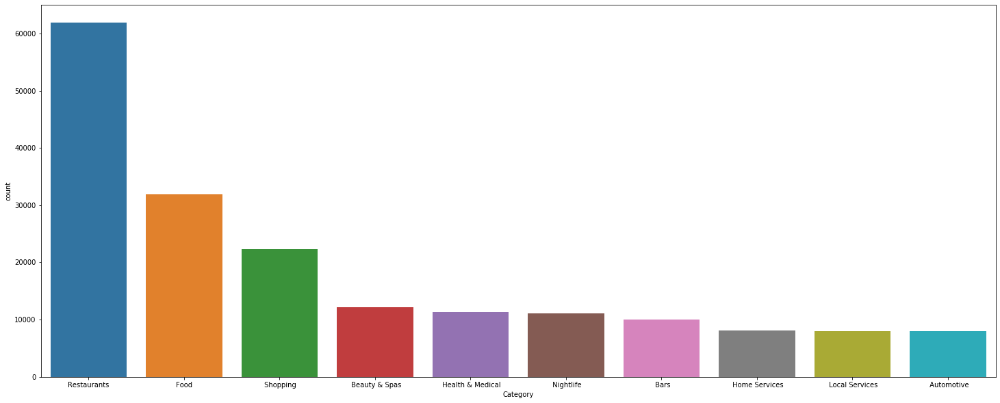

<matplotlib.axes._subplots.AxesSubplot at 0x7f2a574bcd50>

In [0]:
plt.figure(figsize=(25,10))
sns.countplot(x='Category',data=biz_pd, order= biz_pd['Category'].value_counts().index[:10])

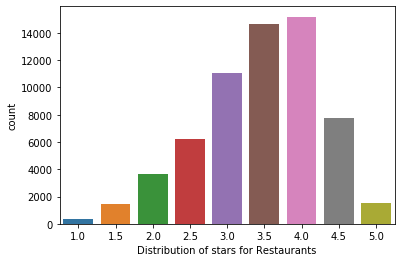

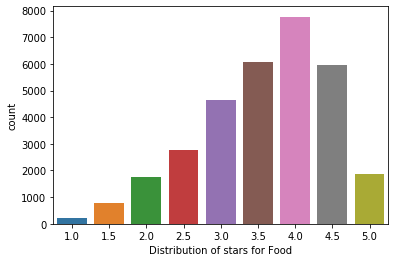

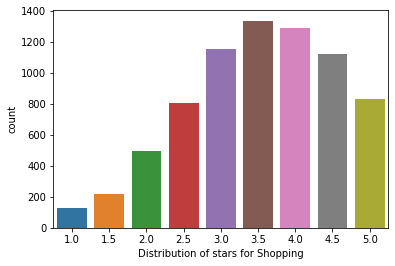

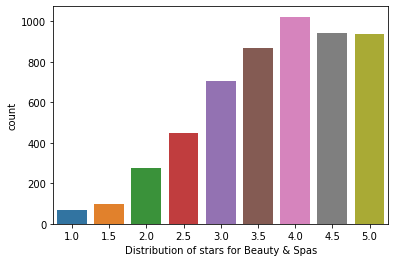

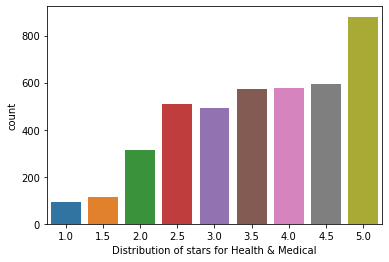

In [0]:
top_cat=['Restaurants','Food','Shopping','Beauty & Spas','Health & Medical']
for i in top_cat:
  plt.figure(i)
  ax=sns.countplot(x="stars",data=biz_pd.loc[biz_pd['Category']== i])
  ax.set(xlabel="Distribution of stars for " + i)

Find the Top 10 businesses in Yelp

In [0]:
name_biz=biz.groupby('name').agg({"*":"count"})\
.orderBy('count(1)',ascending=False)\
.withColumnRenamed('count(1)','count')
display(name_biz.head(10))

name,count
McDonald's,4202
Starbucks,2833
Walgreens,2206
Subway Restaurants,1882
Taco Bell,1586
The UPS Store,1547
Tim Hortons,1543
Circle K,1426
Pizza Hut,1323
Jack in the Box,1114


Find out at which State and city has the most number of business. Based on the visualization, most of the business is located in the NV, Las Vegas followed by AZ, Phoneix and AZ, Scottsdale so can look more into why there are more businesses set up in those state and city.

In [0]:
num_of_business=biz.groupBy('city','state').agg({"business_id":"count"})\
.orderBy('count(business_id)', ascending=False)\
.withColumnRenamed('count(business_id)', 'Number of Businesses')
display(num_of_business.head(10))

city,state,Number of Businesses
Las Vegas,NV,119271
Phoenix,AZ,69610
Toronto,ON,69402
Charlotte,NC,38540
Scottsdale,AZ,35413
Pittsburgh,PA,27479
Calgary,AB,27296
Montréal,QC,25240
Mesa,AZ,22179
Henderson,NV,19367


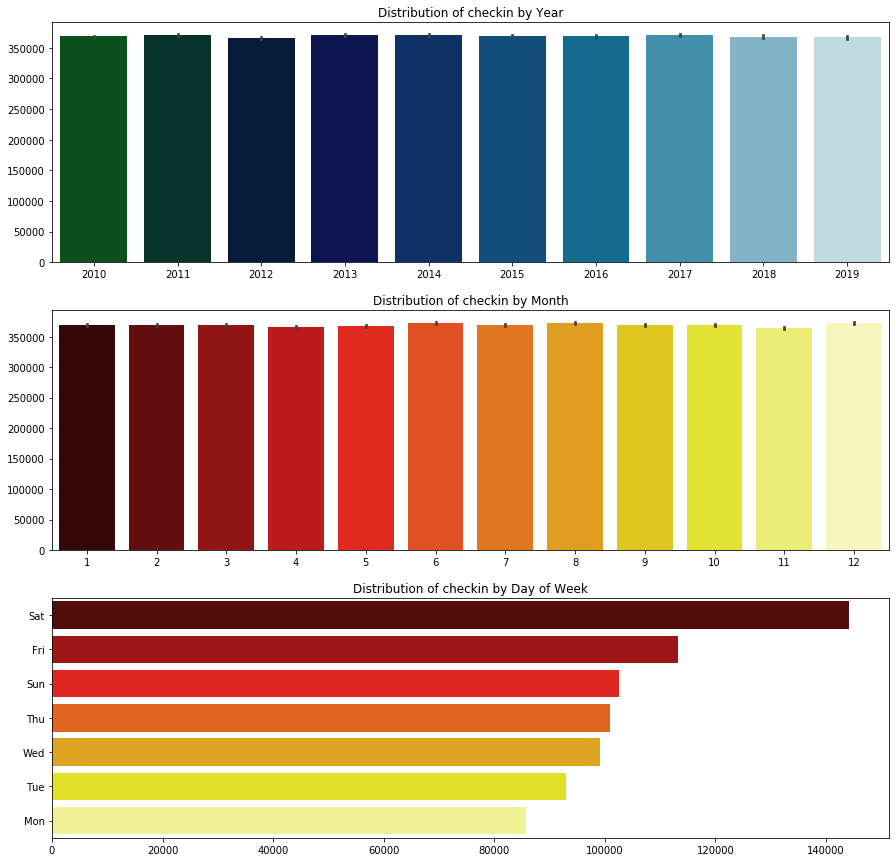

In [0]:
f,ax = plt.subplots(3,1, figsize = (15,15))
ax1,ax2,ax3 = ax.flatten()
cnt = biz_pd['Year'].to_frame()
sns.barplot(cnt['Year'], cnt.index, palette = 'ocean', ax=ax1)
ax1.set_title('Distribution of checkin by Year')
ax1.set_xlabel('')

cnt = biz_pd['Month'].to_frame()
sns.barplot(cnt['Month'], cnt.index, palette = 'hot', ax=ax2)
ax2.set_title('Distribution of checkin by Month')
ax2.set_xlabel('');

cnt = biz_pd['Day of Week'].value_counts().to_frame()
sns.barplot(cnt['Day of Week'], cnt.index, palette = 'hot', ax=ax3)
ax3.set_title('Distribution of checkin by Day of Week')
ax3.set_xlabel('');

Out[23]:

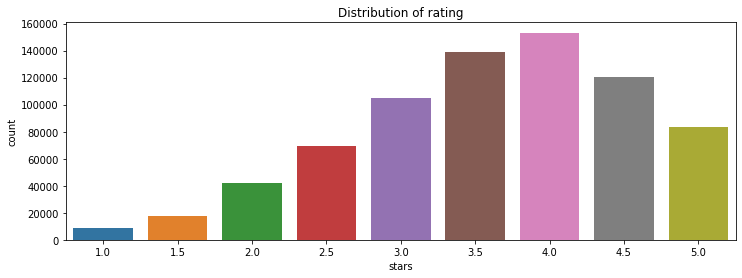

Text(0.5, 1.0, 'Distribution of rating')

In [0]:
plt.figure(figsize=(12,4))
ax=sns.countplot(biz_pd['stars'])
plt.title('Distribution of rating')

Out[24]:

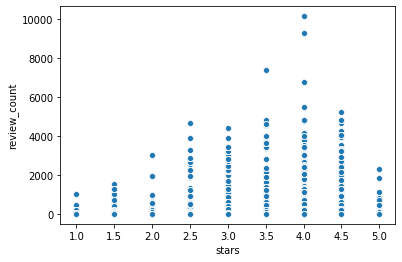

<matplotlib.axes._subplots.AxesSubplot at 0x7f2a575ae750>

In [0]:
sns.scatterplot(data=biz_pd, x='stars',y='review_count')

Out[25]:

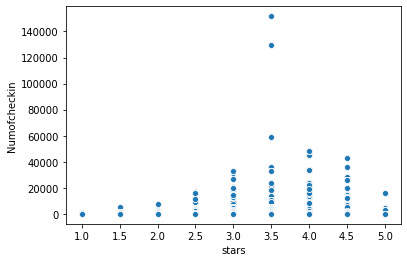

<matplotlib.axes._subplots.AxesSubplot at 0x7f2a55f085d0>

In [0]:
sns.scatterplot(data=biz_pd, x='stars',y='Numofcheckin')

Out[26]:

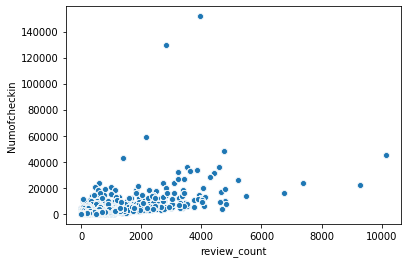

<matplotlib.axes._subplots.AxesSubplot at 0x7f2a57557690>

In [0]:
sns.scatterplot(data=biz_pd, x='review_count',y='Numofcheckin')

Out[27]:

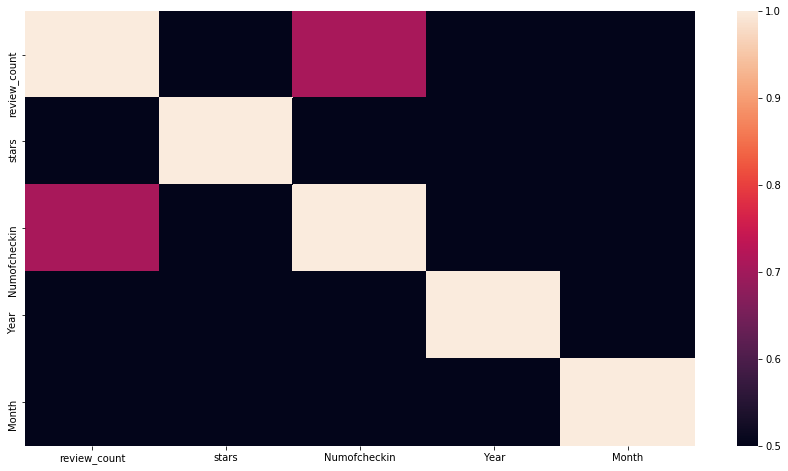

<matplotlib.axes._subplots.AxesSubplot at 0x7f2a574d3850>

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(biz_pd.corr(),vmin=0.5,vmax=1)